# Train Your Dreambooth Model

In [6]:
SD_NAME="CompVis/stable-diffusion-v1-4"
TOKEN="aabbccddeeffgg"
INPUT_DIR="/home/ubuntu/data" # This is the path to input training photos
MODEL_DIR="/home/ubuntu/model" # This is the path to save the trained model
PRED_DIR="/home/ubuntu/predict" # This is the path to save the predicted images
!mkdir -p "$MODEL_DIR"
!mkdir -p "$PRED_DIR"

# 1xA100:
BATCH_SIZE=2
LR=1e-6

!(python train_dreambooth.py \
  --config_file config.yaml \
  learning_rate="$LR" \
  wandb_mode=disabled \
  with_prior_preservation=false \
  center_crop=true \
  instance_str="$TOKEN" \
  instance_data_dir="$INPUT_DIR" \
  output_dir="$MODEL_DIR" \
  max_train_steps=1000 \
  use_tf32=true \
)

--------------------------------------------------------------------------
detected:

  Local host:            129-146-109-232
  Device name:           mlx5_0
  Device vendor ID:      0x02c9
  Device vendor part ID: 4126

Default device parameters will be used, which may result in lower
performance.  You can edit any of the files specified by the
btl_openib_device_param_files MCA parameter to set values for your
device.

NOTE: You can turn off this warning by setting the MCA parameter
      btl_openib_warn_no_device_params_found to 0.
--------------------------------------------------------------------------
--------------------------------------------------------------------------
No OpenFabrics connection schemes reported that they were able to be
used on a specific port.  As such, the openib BTL (OpenFabrics
support) will be disabled for this port.

  Local host:           129-146-109-232
  Local device:         mlx5_0
  Local port:           1
  CPCs attempted:       udcm
---------

# Validate the model with prepared prompts

In [10]:
NUM_PRED=2 # number of predictions per prompt

!( python test_dreambooth.py \
    --model_path $MODEL_DIR \
    --pred_path $PRED_DIR \
    --num_preds $NUM_PRED \
    --ddim \
)

--------------------------------------------------------------------------
detected:

  Local host:            129-146-109-232
  Device name:           mlx5_0
  Device vendor ID:      0x02c9
  Device vendor part ID: 4126

Default device parameters will be used, which may result in lower
performance.  You can edit any of the files specified by the
btl_openib_device_param_files MCA parameter to set values for your
device.

NOTE: You can turn off this warning by setting the MCA parameter
      btl_openib_warn_no_device_params_found to 0.
--------------------------------------------------------------------------
--------------------------------------------------------------------------
No OpenFabrics connection schemes reported that they were able to be
used on a specific port.  As such, the openib BTL (OpenFabrics
support) will be disabled for this port.

  Local host:           129-146-109-232
  Local device:         mlx5_0
  Local port:           1
  CPCs attempted:       udcm
---------

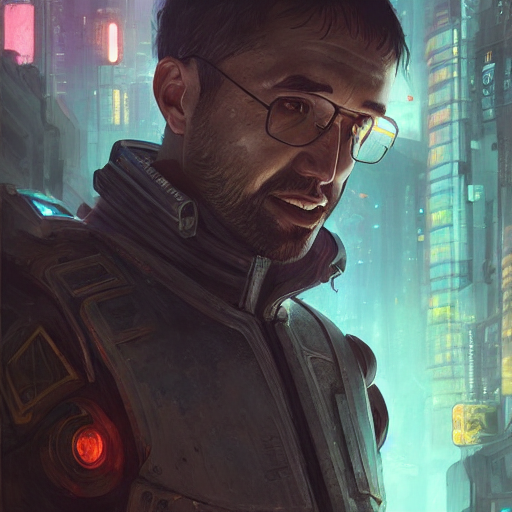

/home/ubuntu/predict/5-cyberpunkrutkowski-20221124-203715-.png


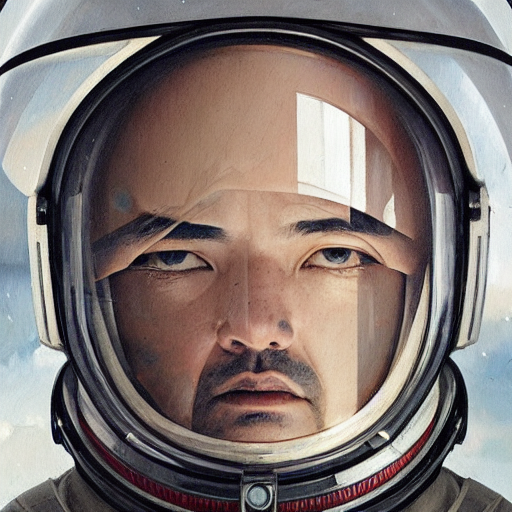

/home/ubuntu/predict/6-astronautrutkowski-20221124-203649-.png


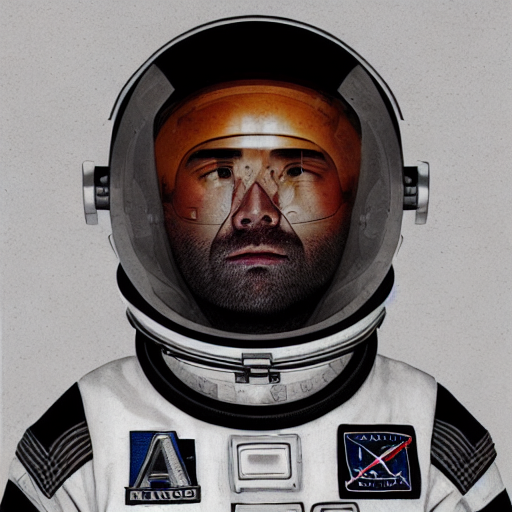

/home/ubuntu/predict/6-astronautrutkowski-20221124-203719-.png


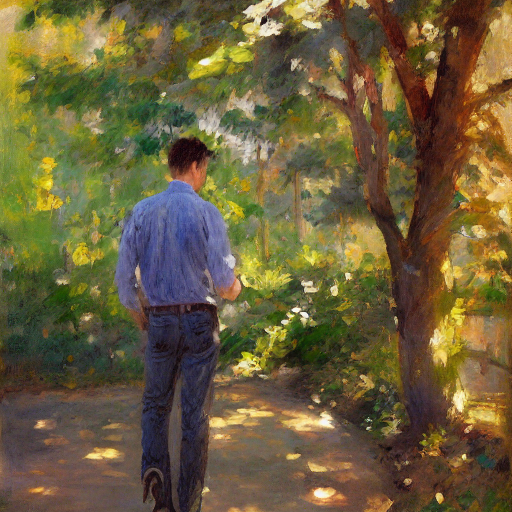

/home/ubuntu/predict/9-danielgerhartz-20221124-203729-.png


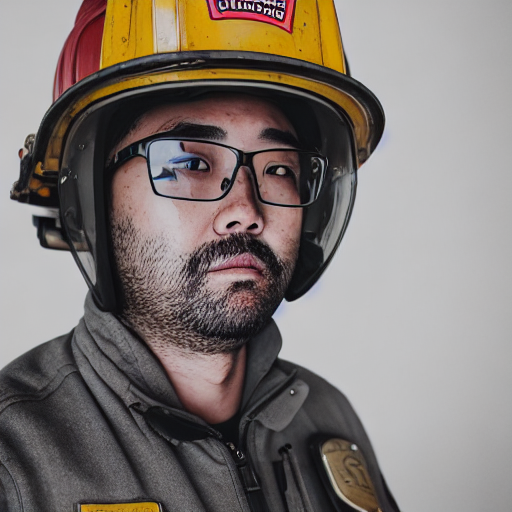

/home/ubuntu/predict/7-firefighter-20221124-203722-.png


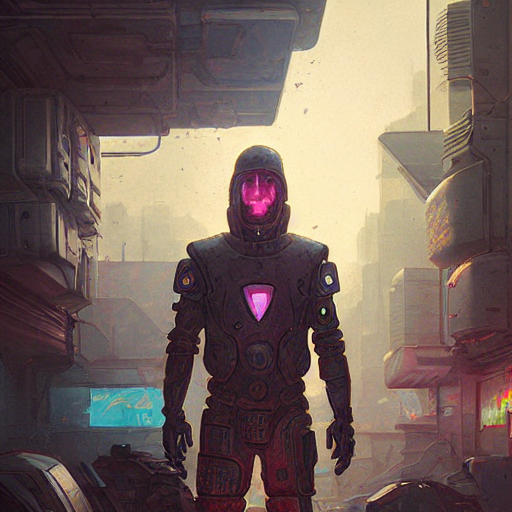

/home/ubuntu/predict/5-cyberpunkrutkowski-20221124-203645-.png


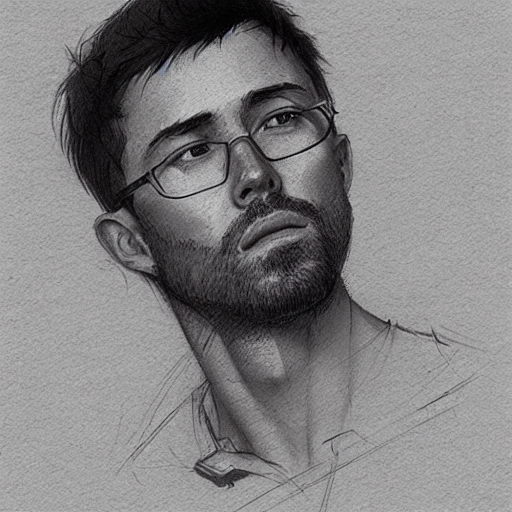

/home/ubuntu/predict/2-rutkowskiartgem-20221124-203635-.png


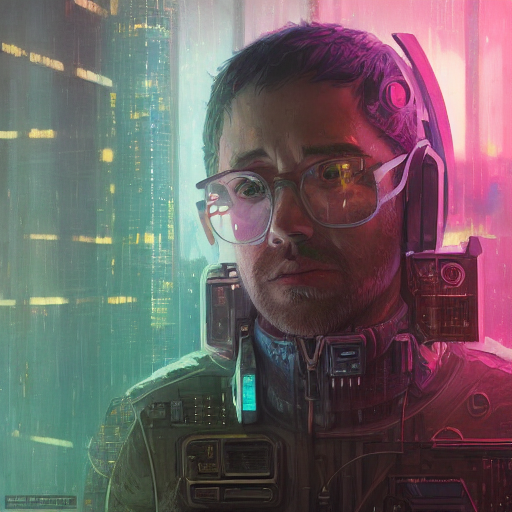

/home/ubuntu/predict/3-rutkowskibraincells-20221124-203638-.png


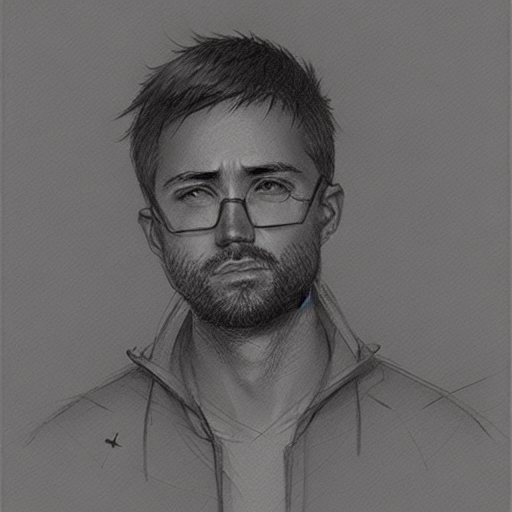

/home/ubuntu/predict/2-rutkowskiartgem-20221124-203705-.png


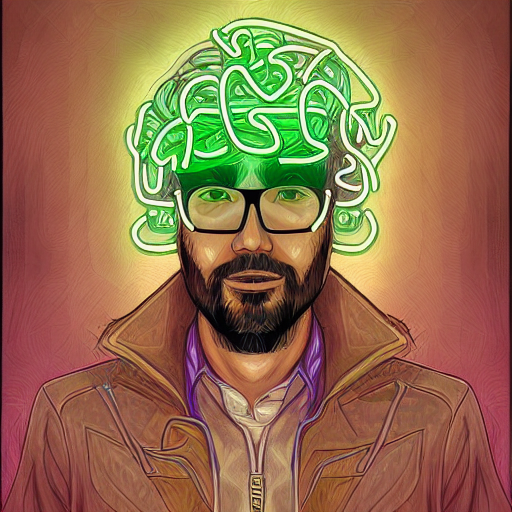

/home/ubuntu/predict/8-steampunk-20221124-203655-.png


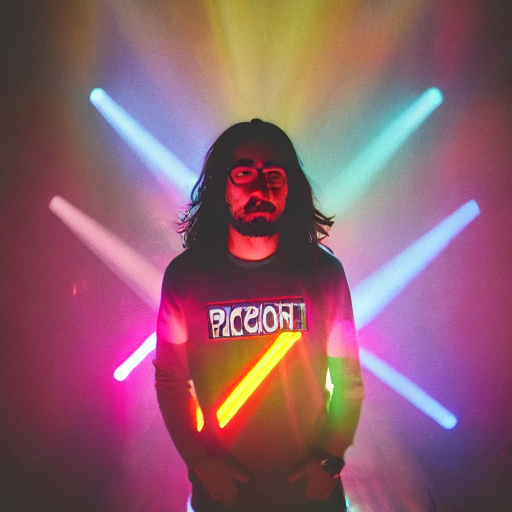

/home/ubuntu/predict/4-longhair-20221124-203712-.png


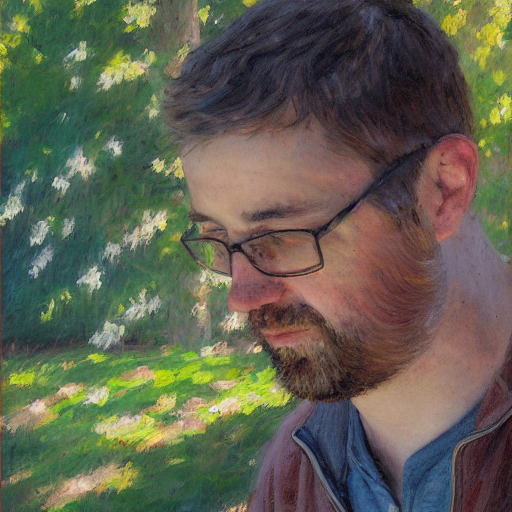

/home/ubuntu/predict/9-danielgerhartz-20221124-203659-.png


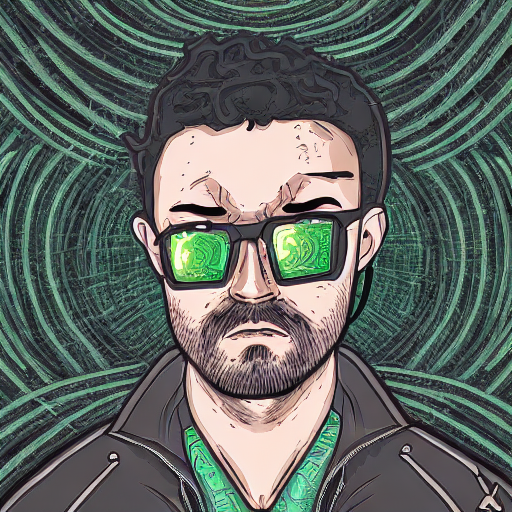

/home/ubuntu/predict/8-steampunk-20221124-203725-.png


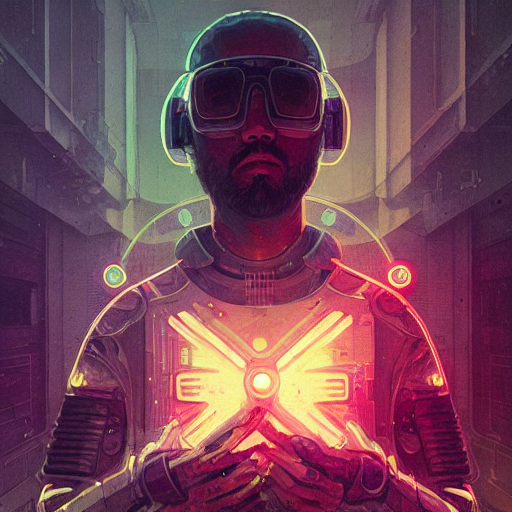

/home/ubuntu/predict/3-rutkowskibraincells-20221124-203709-.png


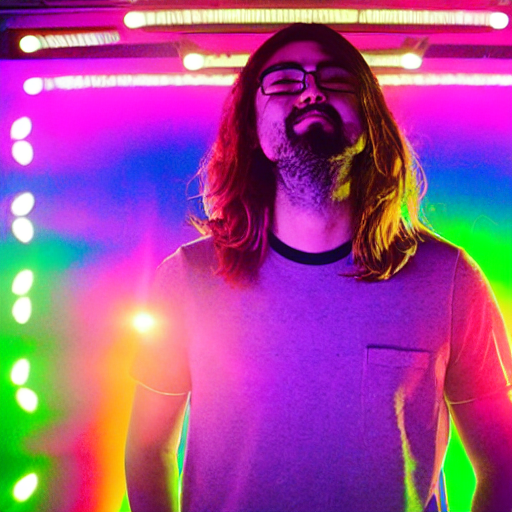

/home/ubuntu/predict/4-longhair-20221124-203642-.png


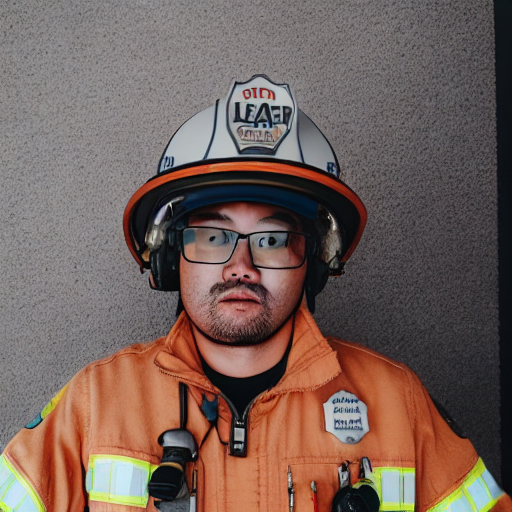

/home/ubuntu/predict/7-firefighter-20221124-203652-.png


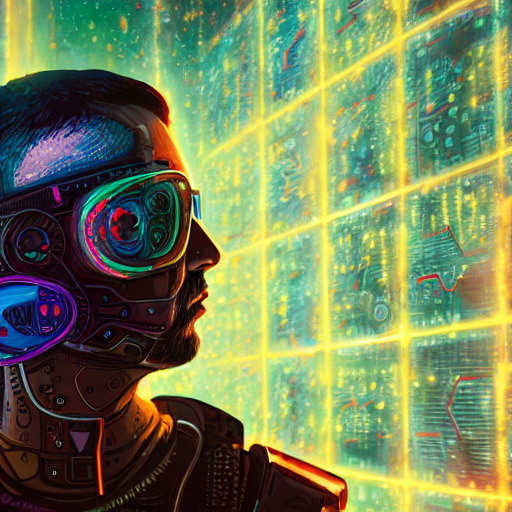

/home/ubuntu/predict/1-rutkowski-20221124-203632-.png


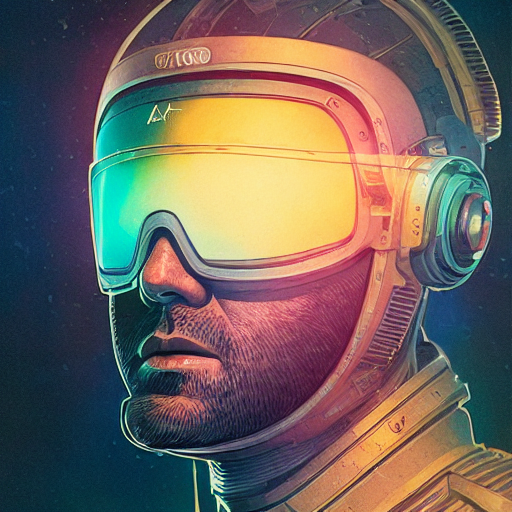

/home/ubuntu/predict/1-rutkowski-20221124-203702-.png


In [12]:
import glob
from IPython.display import Image, display
for imageName in glob.glob(PRED_DIR +'/*.png'): #assuming JPG
    display(Image(filename=imageName))
    print(imageName)